# MCTS in GridWorld

In [26]:
using DMUStudent.HW3
using DMUStudent
using POMDPs
import POMDPModelTools: render
using POMDPPolicies

You can create a randomly sampled 100 x 100 grid world with `DenseGridWorld()`:

In [2]:
m = DenseGridWorld();

You can look different parts of the dense grid world with functions from the [explicit](https://juliapomdp.github.io/POMDPs.jl/stable/api/#explicit_api-1) and [common](https://juliapomdp.github.io/POMDPs.jl/stable/api/#common_api-1) section of the POMDPs.jl API

In [3]:
display(actions(m))

(:up, :down, :left, :right)

In [4]:
statetype(m) == GWPos

true

In [5]:
display(transition(m, GWPos(1,1), :left))

                     SparseCat distribution
            ┌                                        ┐ 
     [1, 1] ┤■■■■■■■■■■■■■■■■■■■■ 0.9333333333333333   
     [1, 2] ┤■ 0.033333333333333326                    
   [-1, -1] ┤ 0.0                                      
   [-1, -1] ┤ 0.0                                      
     [2, 1] ┤■ 0.033333333333333326                    
            └                                        ┘ 

You can visualize a grid world, but only up to 60x60 for now. (If you want to help refactor it so that it can handle 100x100, let me know!!)

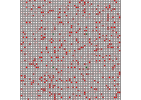

In [6]:
small = DenseGridWorld(size=(60,60))
render(small, (s=GWPos(30,30),)) # the orange circle represents the state (30,30)

You can evaluate either a `POMDPs.Policy` or a `POMDPs.Solver`

In [7]:
heuristic = FunctionPolicy(
    function pi(s) # this function represents a policy
        return :right # always go right
    end
);

In [8]:
evaluate(heuristic, "hw3")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:30


Evaluation complete! Score: -211.99456698783928


-211.99456698783928

In [9]:
evaluate(RandomSolver(), "hw3")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:28


Evaluation complete! Score: -245.79770561877115


-245.79770561877115

You may wish to use the MCTS package to solve this problem. Check the `MCTSSolver` docstring to see what tuning options are available.

In [22]:
using MCTS
solver = MCTSSolver(
    #=
    You probably want to use the max_time option because of the
    0.05 s limit on planning time. max_time only controls the
    iteration portion of the planning and there are a few other
    calculations, so it must be set to a little less than the
    limit
    =#
    max_time = 0.04,
    enable_tree_vis=true, # you may want to disable for max performance
);

# the solver is what you want to submit to be evaluated.
# it is commented out here because it will take several minutes

# evaluate(solver, "hw3")

In [23]:
planner = solve(solver, m);

You can view a tree created at a certain state as follows:

In [24]:
using D3Trees
a, info = action_info(planner, convert(statetype(m), GWPos(22,22)))
D3Tree(info[:tree], init_expand=2)

[22, 22]
N:    364

├──                       up
│  Q:  -3.58
│  N:    359

│  ├──                 [22, 23]
│  │  N:    351

│  │  ├──                       up
│  │  │  Q: -71.78
│  │  │  N:      1
 (1 children)
│  │  ├──                     down
│  │  │  Q:  -2.52
│  │  │  N:    340
 (4 children)
│  │  ├──                     left
│  │  │  Q:  -7.16
│  │  │  N:      9
 (1 children)
│  │  └──                    right
│  │     Q:  -6.53
│  │     N:      1
 (1 children)
│  ├──                 [23, 22]
│  │  N:     10

│  │  ├──                       up
│  │  │  Q: -47.17
│  │  │  N:      1
 (1 children)
│  │  ├──                     down
│  │  │  Q: -25.78
│  │  │  N:      2
 (2 children)
│  │  ├──                     left
│  │  │  Q:  -2.50
│  │  │  N:      6
 (2 children)
│  │  └──                    right
│  │     Q: -46.86
│  │     N:      1
 (1 children)
│  ├──                 [22, 21]
│  │  N:     18

│  │  ├──                       up
│  │  │  Q: -92.94
│  │  │  N:      1
 (1 children)
│  │  ├──                     down
│  │  │  Q:  -7.85
│  │  │  N:     15
 (1 children)
│  │  ├──                     left
│  │  │  Q: -81.75
│  │  │  N:      1
 (1 children)
│  │  └──                    right
│  │     Q: -90.74
│  │     N:      1
 (1 children)
│  └──                 [21, 22]
│     N:     20

│     ├──                       up
│     │  Q:  -1.96
│     │  N:      9
 (2 children)
│     ├──                     down
│     │  Q:  -9.21
│     │  N:      5
 (2 children)
│     ├──                     left
│     │  Q: -54.09
│     │  N:      1
 (1 children)
│     └──                    right
│        Q: -10.76
│        N:      5
 (1 children)
├──                     down
│  Q: -38.85
│  N:      3

│  └──                 [22, 21]
│     N:     18

│     ├──                       up
│     │  Q: -92.94
│     │  N:      1
 (1 children)
│     ├──                     down
│     │  Q:  -7.85
│     │  N:     15
 (1 children)
│     ├──                     left
│     │  Q: -81.75
│     │  N:      1
 (1 children)
│     └──                    right
│        Q: -90.74
│        N:      1
 (1 children)
├──                     left
│  Q: -88.42
│  N:      1

│  └──                 [22, 21]
│     N:     18

│     ├──                       up
│     │  Q: -92.94
│     │  N:      1
 (1 children)
│     ├──                     down
│     │  Q:  -7.85
│     │  N:     15
 (1 children)
│     ├──                     left
│     │  Q: -81.75
│     │  N:      1
 (1 children)
│     └──                    right
│        Q: -90.74
│        N:      1
 (1 children)
└──                    right
   Q: -43.27
   N:      1

   └──                 [23, 22]
      N:     10

      ├──                       up
      │  Q: -47.17
      │  N:      1
 (1 children)
      ├──                     down
      │  Q: -25.78
      │  N:      2
 (2 children)
      ├──                     left
      │  Q:  -2.50
      │  N:      6
 (2 children)
      └──                    right
         Q: -46.86
         N:      1
 (1 children)

You can also view what the tree thinks the value is at each state like this:

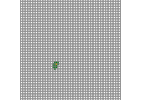

In [25]:
small_planner = solve(solver, small)
a, info = action_info(small_planner, GWPos(22,22))

function val(s)
    tree = info[:tree]
    sid = get(tree.state_map, s, nothing)
    if isnothing(sid)
        return 0.0
    else
        return maximum(tree.q[c] for c in tree.child_ids[sid])
    end
end
render(small, (s=GWPos(22,22),), color=val)